# DSND4: Write a Data Science Blog Post

## Aim: Simple method  to assess your next crypto investment

In this post, we look at correlation analysis of the cryptocurrency market, using Python, to analyze and visualize how these markets have been evolving the years, and provide a base framework for deeper analysis. New to crypto ? You can find a great overview of Satoshi Nakamoto’s innovation [here](https://blockgeeks.com/guides/what-is-blockchain-technology/) 

TLDR: The correlation and trend between various cryptocurrencies are evaluated to understand:
* Which coins can help diversify your portfolio: There is generally a strong correlation between coins, hence it is difficult to diversify risk (Just buying and holding Bitcoin is a safe bet).
* Are stable coins actually stable: Generally they appear to be decoupled from altcoin price fluctuations.
* If it is possible to predict the next bull run: Speculative at best. Nevertheless, end of 2019 looks similar to 2015, 2016 and 2017 … get ready to fill your bags.

Note: Pyviz is used for most of the visualizations you can find out how to install the library [here](https://towardsdatascience.com/pyviz-simplifying-the-data-visualisation-process-in-python-1b6d2cb728f1)

### Data Sources

Modified [Kaggle dataset](https://www.kaggle.com/philmohun/cryptocurrency-financial-data) using data from 2014 -2019, for the top 100 cryptocurrencies by marketcap. Table attributes include:

* Date: refers to the calendar date for the particular row - 24 hours midnight to midnight
* Currency: e.g Bitcoin, price in USD at the end of the day


### Changes
* 10-July-2019: Started Project
* 14-July-2019: Clean Data set
* 15-July-2019: Evaluate correlation 

### TODO

* Use API from a popular exchange to have up to date set
* Add other metrics such as market cap and volume
* Add some sort of sentiment analysis based on google tends or twitter feed analysis
---

## Import and Clean Data

In [1]:
### Import Libraries

# Import libraries necessary for this project
import numpy as np
import pandas as pd
from time import time
from IPython.display import display, HTML # Allows the use of display() for DataFrames
from pathlib import Path
from datetime import datetime

# Import plot libraries
import seaborn as sns
import matplotlib.pyplot as plt

# set up display area 
#pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
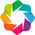

In [2]:
import hvplot.pandas
import holoviews as hv
hv.extension('bokeh', 'matplotlib', width="100")

### Import and view data structure

All the data is numerical except for the date which is converted to a time format later on.

In [3]:
# Data source 
file1="Coinmarketcap.csv"
DataSource = Path.cwd() / "data" / "raw" / file1

# Load the Data
df = pd.read_csv(DataSource)
df.tail()

,DATE,BITCOIN,RIPPLE,ETHEREUM,BITCOIN-CASH,EOS,TETHER,LITECOIN,STELLAR,TRON,BITCOIN-SV,CARDANO,BINANCE-COIN,IOTA,MONERO,DASH,NEM,NEO,ETHEREUM-CLASSIC,MAKER,USD-COIN,ZCASH,WAVES,TEZOS,DOGECOIN,VECHAIN,TRUEUSD,ONTOLOGY,BITCOIN-GOLD,QTUM,ZILLIQA,OMISEGO,0X,CHAINLINK,BASIC-ATTENTION-TOKEN,DECRED,AUGUR,PAXOS-STANDARD-TOKEN,LISK,HOLO,NANO,BITCOIN-DIAMOND,BYTECOIN-BCN,REVAIN,STEEM,ICON,DIGIBYTE,BITSHARES,VERGE,SIACOIN,AETERNITY,STRATIS,GEMINI-DOLLAR,PUNDI-X,BYTOM,IOSTOKEN,KOMODO,DAI,STATUS,POPULOUS,GOLEM,ODEM,FACTOM,ELECTRONEUM,LOOPRING,PAYPIE,CRYPTONEX,REPO,MAIDSAFECOIN,ARDOR,HUOBI-TOKEN,INSIGHT-CHAIN,HYPERCASH,AURORA,MIXIN,WALTONCHAIN,ARK,PIVX,PROJECT-PAI,DECENTRALAND,REDDCOIN,THETA,LINKEY,DIGIXDAO,AION,POWER-LEDGER,KUCOIN-SHARES,TENX,BUGGYRA-COIN-ZERO,DENTACOIN,RAVENCOIN,MONACOIN,CRYPTO-COM,POLYMATH-NETWORK,STASIS-EURS,WANCHAIN,BANCOR,WAX,GXCHAIN,ELASTOS,ZCOIN
1985,"Feb 05, 2014",811.91,0.020357,NaN,NaN,NaN,NaN,20.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001302,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1986,"Feb 04, 2014",827.96,0.020997,NaN,NaN,NaN,NaN,21.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1987,"Feb 03, 2014",823.83,0.021402,NaN,NaN,NaN,NaN,21.91,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001269,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1988,"Feb 02, 2014",825.37,0.021560,NaN,NaN,NaN,NaN,22.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001279,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1989,"Feb 01, 2014",832.58,0.020698,NaN,NaN,NaN,NaN,22.47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001457,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.describe()

,BITCOIN,RIPPLE,ETHEREUM,BITCOIN-CASH,EOS,TETHER,LITECOIN,STELLAR,TRON,BITCOIN-SV,CARDANO,BINANCE-COIN,IOTA,MONERO,DASH,NEM,NEO,ETHEREUM-CLASSIC,MAKER,USD-COIN,ZCASH,WAVES,TEZOS,DOGECOIN,VECHAIN,TRUEUSD,ONTOLOGY,BITCOIN-GOLD,QTUM,ZILLIQA,OMISEGO,0X,CHAINLINK,BASIC-ATTENTION-TOKEN,DECRED,AUGUR,PAXOS-STANDARD-TOKEN,LISK,HOLO,NANO,BITCOIN-DIAMOND,BYTECOIN-BCN,REVAIN,STEEM,ICON,DIGIBYTE,BITSHARES,VERGE,SIACOIN,AETERNITY,STRATIS,GEMINI-DOLLAR,PUNDI-X,BYTOM,IOSTOKEN,KOMODO,DAI,STATUS,POPULOUS,GOLEM,ODEM,FACTOM,ELECTRONEUM,LOOPRING,PAYPIE,CRYPTONEX,REPO,MAIDSAFECOIN,ARDOR,HUOBI-TOKEN,INSIGHT-CHAIN,HYPERCASH,AURORA,MIXIN,WALTONCHAIN,ARK,PIVX,PROJECT-PAI,DECENTRALAND,REDDCOIN,THETA,LINKEY,DIGIXDAO,AION,POWER-LEDGER,KUCOIN-SHARES,TENX,BUGGYRA-COIN-ZERO,DENTACOIN,RAVENCOIN,MONACOIN,CRYPTO-COM,POLYMATH-NETWORK,STASIS-EURS,WANCHAIN,BANCOR,WAX,GXCHAIN,ELASTOS,ZCOIN
count,1990.000000,1990.000000,1438.000000,722.000000,744.000000,1596.000000,1990.000000,1805.000000,670.000000,248.000000,652.000000,720.000000,762.000000,1880.000000,1977.000000,1566.000000,1039.000000,1086.000000,619.000000,280.000000,989.000000,1138.000000,651.000000,1990.000000,346.000000,496.000000,494.000000,630.000000,782.000000,536.000000,731.000000,698.000000,663.000000,774.000000,1251.000000,1257.000000,291.000000,1195.000000,441.000000,845.000000,598.000000,1853.000000,621.000000,1183.000000,626.000000,1985.000000,1820.000000,1724.000000,1418.000000,774.000000,1067.000000,282.000000,480.000000,706.000000,545.000000,890.000000,565.000000,747.000000,733.000000,30.000000,461.000000,1378.000000,620.000000,684.000000,641.000000,642.000000,412.000000,1904.000000,1019.000000,527.000000,341.000000,694.000000,384.000000,537.000000,687.000000,845.000000,1248.000000,375.000000,666.000000,1980.000000,544.000000,333.000000,1183.000000,635.000000,621.000000,629.000000,748.000000,279.000000,703.000000,492.000000,1914.000000,742.000000,528.000000,350.000000,479.000000,757.000000,571.000000,750.000000,529.000000,1012.000000
mean,2947.883080,0.198028,207.068463,707.441233,5.658892,1.000188,38.534377,0.077051,0.031770,100.183468,0.154694,11.433321,0.944158,55.330154,122.015339,0.119914,25.257088,10.827236,661.934637,1.008263,182.477260,2.901754,2.105175,0.001486,0.007835,1.006021,2.382538,67.764651,11.292826,0.044417,6.778083,0.607055,0.541955,0.252579,28.972284,18.895473,1.006595,4.234654,0.001052,2.966726,6.767022,0.001083,0.448982,1.147122,1.709002,0.009393,0.068874,0.011084,0.005835,1.186920,2.995807,1.005472,0.002224,0.249924,0.020058,1.884913,1.000189,0.070421,9.347783,0.091582,0.221943,10.190235,0.026282,0.253984,0.505257,2.869809,0.269154,0.172847,0.192344,2.321951,0.295589,6.782074,0.021636,392.777970,6.615435,1.697900,1.745526,0.180302,0.072121,0.001415,0.118824,0.654221,68.801310,1.338901,0.312991,2.209322,1.722901,0.016183,0.000356,0.031821,1.034581,6.261335,0.303246,1.135486,1.597017,2.380744,0.194538,2.351488,16.741815,16.954531
std,3634.902937,0.340216,256.877569,602.792001,3.899264,0.018690,56.313997,0.125015,0.024697,53.864383,0.174170,8.548789,0.943296,84.750018,210.203713,0.219560,33.083000,9.164005,259.166149,0.008168,165.183983,2.775092,1.506574,0.001973,0.003729,0.009177,2.139338,87.982917,12.621854,0.034772,5.577114,0.432460,0.547883,0.119577,28.811046,17.234343,0.007147,6.105578,0.000445,4.961949,12.953686,0.002019,0.569276,1.237008,2.108581,0.015497,0.111485,0.026600,0.009709,0.971013,3.634346,0.012036,0.002832,0.211676,0.016445,1.868572,0.013116,0.081940,13.067103,0.009737,0.078356,11.646731,0.033533,0.289539,0.624960,2.015815,0.203915,0.188694,0.302599,1.081746,0.084926,7.174716,0.010891,425.336312,7.025685,1.789034,2.362817,0.271927,0.039384,0.002858,0.048345,0.152468,87.976204,1.750890,0.311372,2.635082,5.185020,0.008255,0.000562,0.017776,2.120405,3.839408,0.284610,0.023040,2.020696,2.245830,0.337149,1.584304,19.454731,21.737473
min,178.100000,0.002810,0.434829,77.370000,0.493225,0.606229,1.160000,0.001357,0.001427,42.750000,0.018539,0.099867,0.158688,0.22352

In [5]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1990 entries, 0 to 1989
Data columns (total 101 columns):
DATE                     object
BITCOIN                  float64
RIPPLE                   float64
ETHEREUM                 float64
BITCOIN-CASH             float64
EOS                      float64
TETHER                   float64
LITECOIN                 float64
STELLAR                  float64
TRON                     float64
BITCOIN-SV               float64
CARDANO                  float64
BINANCE-COIN             float64
IOTA                     float64
MONERO                   float64
DASH                     float64
NEM                      float64
NEO                      float64
ETHEREUM-CLASSIC         float64
MAKER                    float64
USD-COIN                 float64
ZCASH                    float64
WAVES                    float64
TEZOS                    float64
DOGECOIN                 float64
VECHAIN                  float64
TRUEUSD                  float64
ON

###  Visualize imported data

In general, except for the stable coins such as Tether, the price es of all coins seems to follow the same trend.
We will look at how correlated these trends actually are.


In [6]:
# Convert time from object to datetime
df['DATE']=pd.to_datetime(df['DATE'])

In [7]:
# Add year and month column for correlation analysis later on
df['Year']= pd.DatetimeIndex(df['DATE']).year
df['Month']= pd.DatetimeIndex(df['DATE']).month
df.head()

,DATE,BITCOIN,RIPPLE,ETHEREUM,BITCOIN-CASH,EOS,TETHER,LITECOIN,STELLAR,TRON,BITCOIN-SV,CARDANO,BINANCE-COIN,IOTA,MONERO,DASH,NEM,NEO,ETHEREUM-CLASSIC,MAKER,USD-COIN,ZCASH,WAVES,TEZOS,DOGECOIN,VECHAIN,TRUEUSD,ONTOLOGY,BITCOIN-GOLD,QTUM,ZILLIQA,OMISEGO,0X,CHAINLINK,BASIC-ATTENTION-TOKEN,DECRED,AUGUR,PAXOS-STANDARD-TOKEN,LISK,HOLO,NANO,BITCOIN-DIAMOND,BYTECOIN-BCN,REVAIN,STEEM,ICON,DIGIBYTE,BITSHARES,VERGE,SIACOIN,AETERNITY,STRATIS,GEMINI-DOLLAR,PUNDI-X,BYTOM,IOSTOKEN,KOMODO,DAI,STATUS,POPULOUS,GOLEM,ODEM,FACTOM,ELECTRONEUM,LOOPRING,PAYPIE,CRYPTONEX,REPO,MAIDSAFECOIN,ARDOR,HUOBI-TOKEN,INSIGHT-CHAIN,HYPERCASH,AURORA,MIXIN,WALTONCHAIN,ARK,PIVX,PROJECT-PAI,DECENTRALAND,REDDCOIN,THETA,LINKEY,DIGIXDAO,AION,POWER-LEDGER,KUCOIN-SHARES,TENX,BUGGYRA-COIN-ZERO,DENTACOIN,RAVENCOIN,MONACOIN,CRYPTO-COM,POLYMATH-NETWORK,STASIS-EURS,WANCHAIN,BANCOR,WAX,GXCHAIN,ELASTOS,ZCOIN,Year,Month
0,2019-07-14,10256.06,0.306426,227.58,282.84,4.12,0.999995,89.77,0.086249,0.025332,126.40,0.059429,28.92,0.306648,85.92,124.18,0.062032,12.09,5.67,592.28,0.998568,82.28,1.48,0.936902,0.003014,0.005711,1.000000,0.899897,27.10,3.08,0.012314,1.58,0.222813,2.79,0.249876,28.42,13.33,1.000000,1.26,0.001339,1.02,0.849512,0.000736,0.106007,0.272194,0.343041,0.011755,0.041930,0.005982,0.002805,0.316608,0.599129,0.991987,0.000616,0.112633,0.007756,1.31,0.955374,0.020594,0.641686,0.061647,0.189516,4.34,0.005831,0.039699,0.187092,0.366809,0.143282,0.159801,0.068085,3.97,0.328426,3.21,0.022139,195.08,1.99,0.331861,0.465219,0.031288,0.040819,0.001414,0.106935,0.323614,19.44,0.088034,0.075287,1.35,0.158453,0.016736,0.000045,0.042960,1.75,5.26,0.058049,1.12,0.267141,0.533236,0.046500,1.42,2.93,9.00,2019,7
1,2019-07-13,11392.38,0.332179,269.46,344.95,4.75,0.998694,101.02,0.095468,0.028406,153.80,0.066770,31.51,0.345428,93.36,140.50,0.073342,14.16,6.63,658.59,0.999131,89.73,1.55,0.997331,0.003249,0.006493,0.999778,1.070000,28.23,3.58,0.014052,1.86,0.256447,3.17,0.286967,30.85,14.69,0.998942,1.42,0.001443,1.15,0.995500,0.000815,0.112471,0.280995,0.300654,0.012903,0.049258,0.006762,0.003093,0.374251,0.678454,0.998279,0.000711,0.141331,0.009414,1.44,0.994050,0.022991,0.773491,0.072521,0.223450,4.68,0.006292,0.045383,0.197694,0.443202,0.170628,0.168633,0.081798,4.03,0.340170,3.90,0.021963,211.19,2.31,0.396186,0.523689,0.040101,0.046443,0.001590,0.117317,0.323614,24.66,0.100056,0.085178,1.54,0.180118,0.019442,0.000046,0.050490,2.03,5.64,0.065271,1.11,0.300015,0.622209,0.054454,1.65,3.41,10.52,2019,7
2,2019-07-12,11815.99,0.344118,276.28,354.46,4.82,1.010000,105.30,0.097963,0.029586,166.61,0.069754,31.69,0.356002,98.25,143.70,0.077877,15.40,6.81,664.12,1.000000,93.52,1.63,1.080000,0.003340,0.006882,1.000000,1.120000,30.27,3.86,0.014598,2.00,0.266248,3.17,0.291175,31.46,15.34,1.000000,1.48,0.001529,1.19,1.020000,0.000879,0.114039,0.291050,0.310023,0.013161,0.051175,0.006753,0.003190,0.381738,0.696538,1.000000,0.000735,0.141743,0.009842,1.54,0.942901,0.023376,0.810737,0.075471,0.227337,4.42,0.005712,0.046337,0.197694,0.477695,0.177173,0.175917,0.085748,4.01,0.348692,4.14,0.025601,229.40,2.48,0.398525,0.542808,0.037011,0.047165,0.001735,0.112778,0.323614,27.13,0.102743,0.088055,1.59,0.185292,0.020354,0.000050,0.047247,2.17,5.64,0.067616,1.11,0.307133,0.642865,0.057032,1.81,3.50,10.61,2019,7
3,2019-07-11,11358.66,0.330335,268.70,345.88,4.69,0.996514,102.64,0.087008,0.027933,162.79,0.065199,29.64,0.343193,89.11,142.99,0.076525,14.61,6.63,660.50,0.999335,88.04,1.50,1.010000,0.003243,0.006017,1.000000,1.070000,28.68,3.57,0.014096,1.92,0.257108,2.83,0.292996,30.07,14.22,0.999690,1.40,0.001489,1.10,0.984058,0.000759,0.112112,0.278562,0.295410,0.011978,0.049576,0.006513,0.003099,0.369350,0.660299,0.996111,0.000706,0.132854,0.009694,1.36,0.977895,0.022650,0.669288,0.072235,0.226531,4.34,0.005479,0.043868,0.192475,0.477540,0.241299,0.164519,0.080705,3.69,0.344930,3.65,0.026252,220.70,2.45,0.367288,0.524027,0.034897,0.044790,0.001589,0.113052,0.323614,22.71,0.099239,0.083118,1.51,0.162123,0.010036,0.

In [8]:
# Get coin names
coinNames=list(df.columns.values)
coinNames.remove('DATE')
coinNames.remove('Year')
coinNames.remove('Month')

#### Plot of 10 selected coins

In [9]:
img1=df.hvplot.line(x='DATE', y=['BITCOIN','RAVENCOIN','LITECOIN','OMISEGO','TETHER','RIPPLE','EOS','TRON','ZCOIN','DOGECOIN'],  logy=True, height=500,width=800 ,ylabel='Coin Price USD',).opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})

#### Plot of all coins

In [10]:
df.hvplot.line(x='DATE', y=coinNames,  logy=True, height=500,width=800 ,ylabel='Coin Price USD' ).opts(fontsize={'title': 16, 'legend': 10, 'xticks': 14, 'yticks': 14})

:NdOverlay   [Variable]
   :Curve   [DATE]   (value)

In [11]:
# Reshape data table for easier anlysis 
df1=pd.melt(df, id_vars=['DATE'], value_vars=coinNames, var_name='Coin', value_name='Coin Price USD')
df1['Year']= pd.DatetimeIndex(df1['DATE']).year
df1['Month']= pd.DatetimeIndex(df1['DATE']).month
df1.head()

,DATE,Coin,Coin Price USD,Year,Month
0,2019-07-14,BITCOIN,10256.06,2019,7
1,2019-07-13,BITCOIN,11392.38,2019,7
2,2019-07-12,BITCOIN,11815.99,2019,7
3,2019-07-11,BITCOIN,11358.66,2019,7
4,2019-07-10,BITCOIN,12156.51,2019,7


#### View trend of each coin

In [12]:
df1.hvplot.line(x='DATE',y='Coin Price USD', groupby='Coin',logy=True)

:DynamicMap   [Coin]
   :Curve   [DATE]   (Coin Price USD)

## Correlation Analysis

Coefficients close to 1 or -1 mean that the series' are strongly correlated or inversely correlated respectively, and coefficients close to zero mean that the values are not correlated, and fluctuate independently of each other.
However, calculating the correlations directly on a [non-stationary time series data](http://www.statsoft.com/Textbook/Time-Series-Analysis) can give biased [correlation values](https://stats.stackexchange.com/questions/278375/finding-correlation-between-time-series-is-it-a-meaningless-value) . Hence, the daily return percentage change is used.

In general, three main trends stand out for the top 20 cryptocurrencies by market cap:
* All the stable coins (a cryptocurrency that is pegged to fiat or some other commodity e.g Tether is pegged to the USD) and Ravencoin, had a very low correlation with bitcoin and the other altcoins.
* There is a general trend over the years for all coins to be highly correlated (excludes stable coins and Ravencoin)
* Only 45% of the top 20 coins existed 5 years ago. 

### Correlation of daily percentage change by year

In [13]:
# Drop date year and month
df2=df.drop(columns=['DATE','Year','Month'])

In [14]:
# Apply percent change
df_pct=df2.pct_change()

In [15]:
# Re-append date to the daily percentage change for each coin
df_pct['DATE']=df['DATE']
df_pct['Year']=df['Year']
df_pct['Month']=df['Month']
df_pct.head()

,BITCOIN,RIPPLE,ETHEREUM,BITCOIN-CASH,EOS,TETHER,LITECOIN,STELLAR,TRON,BITCOIN-SV,CARDANO,BINANCE-COIN,IOTA,MONERO,DASH,NEM,NEO,ETHEREUM-CLASSIC,MAKER,USD-COIN,ZCASH,WAVES,TEZOS,DOGECOIN,VECHAIN,TRUEUSD,ONTOLOGY,BITCOIN-GOLD,QTUM,ZILLIQA,OMISEGO,0X,CHAINLINK,BASIC-ATTENTION-TOKEN,DECRED,AUGUR,PAXOS-STANDARD-TOKEN,LISK,HOLO,NANO,BITCOIN-DIAMOND,BYTECOIN-BCN,REVAIN,STEEM,ICON,DIGIBYTE,BITSHARES,VERGE,SIACOIN,AETERNITY,STRATIS,GEMINI-DOLLAR,PUNDI-X,BYTOM,IOSTOKEN,KOMODO,DAI,STATUS,POPULOUS,GOLEM,ODEM,FACTOM,ELECTRONEUM,LOOPRING,PAYPIE,CRYPTONEX,REPO,MAIDSAFECOIN,ARDOR,HUOBI-TOKEN,INSIGHT-CHAIN,HYPERCASH,AURORA,MIXIN,WALTONCHAIN,ARK,PIVX,PROJECT-PAI,DECENTRALAND,REDDCOIN,THETA,LINKEY,DIGIXDAO,AION,POWER-LEDGER,KUCOIN-SHARES,TENX,BUGGYRA-COIN-ZERO,DENTACOIN,RAVENCOIN,MONACOIN,CRYPTO-COM,POLYMATH-NETWORK,STASIS-EURS,WANCHAIN,BANCOR,WAX,GXCHAIN,ELASTOS,ZCOIN,DATE,Year,Month
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-07-14,2019,7
1,0.110795,0.084043,0.184023,0.219594,0.152913,-0.001301,0.125320,0.106888,0.121348,0.216772,0.123526,0.089557,0.126464,0.086592,0.131422,0.182325,0.171216,0.169312,0.111957,0.000564,0.090544,0.047297,0.064499,0.077969,0.136929,-0.000222,0.189025,0.041697,0.162338,0.141140,0.177215,0.150952,0.136201,0.148438,0.085503,0.102026,-0.001058,0.126984,0.077670,0.127451,0.171849,0.107337,0.060977,0.032334,-0.123562,0.097661,0.174767,0.130391,0.102674,0.182064,0.132401,0.006343,0.154221,0.254792,0.213770,0.099237,0.040483,0.116393,0.205404,0.176391,0.179056,0.078341,0.079060,0.143177,0.056667,0.208264,0.190854,0.055269,0.201410,0.015113,0.035758,0.214953,-0.007950,0.082582,0.160804,0.193831,0.125683,0.281673,0.137779,0.124470,0.097087,0.0,0.268519,0.136561,0.131377,0.140741,0.136728,0.161687,0.022222,0.175279,0.160000,0.072243,0.124412,-0.008929,0.123059,0.166855,0.171054,0.161972,0.163823,0.168889,2019-07-13,2019,7
2,0.037184,0.035941,0.025310,0.027569,0.014737,0.011321,0.042368,0.026134,0.041541,0.083290,0.044691,0.005712,0.030611,0.052378,0.022776,0.061834,0.087571,0.027149,0.008397,0.000870,0.042238,0.051613,0.082890,0.028009,0.059911,0.000222,0.046729,0.072264,0.078212,0.038856,0.075269,0.038218,0.000000,0.014664,0.019773,0.044248,0.001059,0.042254,0.059598,0.034783,0.024611,0.078528,0.013941,0.035784,0.031162,0.019995,0.038918,-0.001331,0.031361,0.020005,0.026655,0.001724,0.033755,0.002915,0.045464,0.069444,-0.051455,0.016746,0.048153,0.040678,0.017395,-0.055556,-0.092181,0.021021,0.000000,0.077827,0.038358,0.043194,0.048290,-0.004963,0.025052,0.061538,0.165642,0.086226,0.073593,0.005904,0.036508,-0.077055,0.015546,0.091195,-0.038690,0.0,0.100162,0.026855,0.033776,0.032468,0.028726,0.046909,0.086957,-0.064231,0.068966,0.000000,0.035927,0.000000,0.023725,0.033198,0.047343,0.096970,0.026393,0.008555,2019-07-12,2019,7
3,-0.038704,-0.040053,-0.027436,-0.024206,-0.026971,-0.013352,-0.025261,-0.111828,-0.055871,-0.022928,-0.065301,-0.064689,-0.035980,-0.093028,-0.004941,-0.017361,-0.051299,-0.026432,-0.005451,-0.000665,-0.058597,-0.079755,-0.064815,-0.029042,-0.125690,0.000000,-0.044643,-0.052527,-0.075130,-0.034388,-0.040000,-0.034329,-0.107256,0.006254,-0.044183,-0.073012,-0.000310,-0.054054,-0.026161,-0.075630,-0.035237,-0.136519,-0.016898,-0.042907,-0.047135,-0.089887,-0.031246,-0.035540,-0.028527,-0.032452,-0.052027,-0.003889,-0.039456,-0.062712,-0.015038,-0.116883,0.037113,-0.031057,-0.174470,-0.042877,-0.003545,-0.018100,-0.040791,-0.053284,-0.026399,-0.000324,0.361940,-0.064792,-0.058812,-0.079800,-0.010789,-0.118357,0.025429,-0.037925,-0.012097,-0.078382,-0.034600,-0.057118,-0.050355,-0.084150,0.002430,0.0,-0.162919,-0.034105,-0.056067,-0.050314,-0.125

In [16]:
def correlation_map(data, columns, figsize=(15,10)):
    ''' Plots correlation heat map.

    Parameters:
    -----------
        data (pd): Cleaned Pandas dataframe of values
        columns (list): Column names for which  the correlation is wanted

    Returns:
    --------
        Correlation heat map

    '''
    
    correlation = (data.loc[:, columns]).corr()

    fig, ax = plt.subplots(figsize = figsize)
    sns.heatmap(correlation, annot = True, ax = ax,cmap="coolwarm",vmin=-1,vmax=1)

In [17]:
# Top 20 coins by market cap in 2019
top20=['BITCOIN','ETHEREUM','RIPPLE','LITECOIN','BITCOIN-CASH','EOS',
       'TETHER','BINANCE-COIN','BITCOIN-SV','STELLAR','TRON','CARDANO',
       'MONERO','DASH','CHAINLINK','NEO','IOTA','TEZOS','OMISEGO','RAVENCOIN']

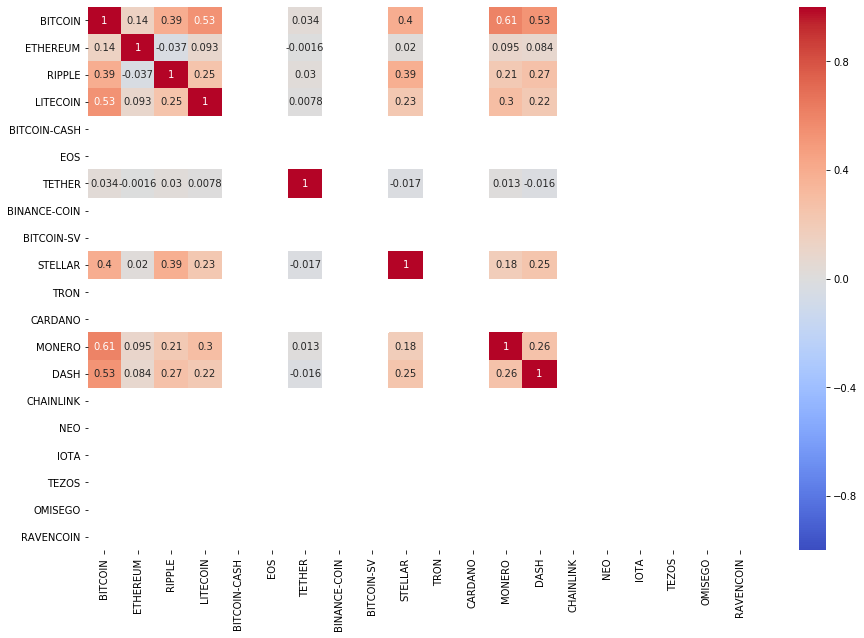

In [18]:
criteria = df_pct['Year'].isin([2015])
correlation_map(df_pct[criteria].drop(columns=['DATE','Year','Month']), top20)

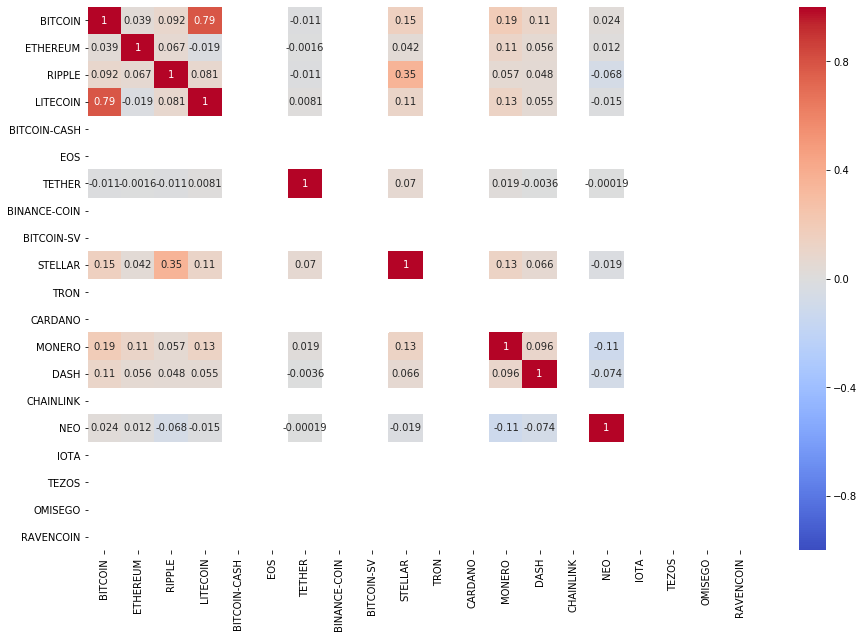

In [19]:
criteria = df_pct['Year'].isin([2016])
correlation_map(df_pct[criteria].drop(columns=['DATE','Year','Month']), top20)

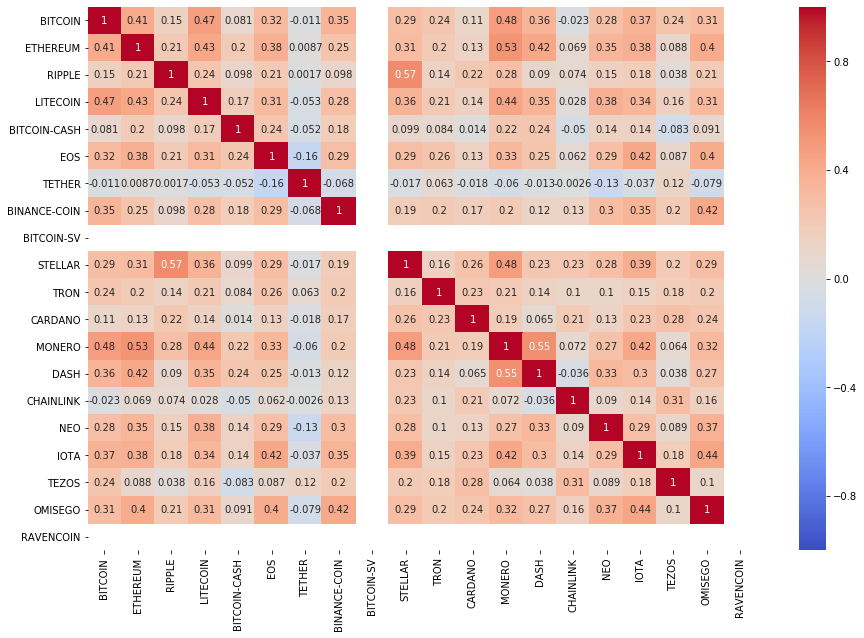

In [20]:
criteria = df_pct['Year'].isin([2017])
correlation_map(df_pct[criteria].drop(columns=['DATE','Year','Month']), top20)

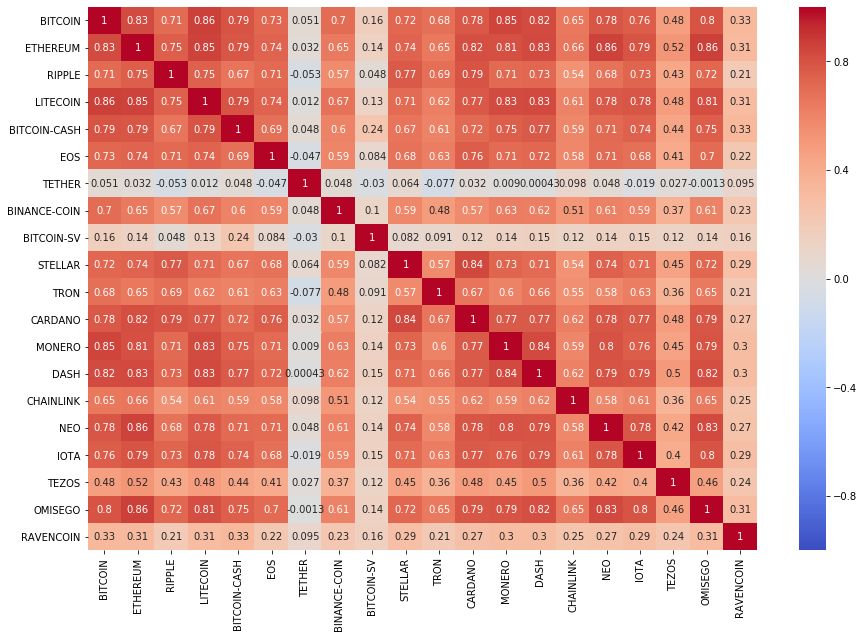

In [21]:
criteria = df_pct['Year'].isin([2018])
correlation_map(df_pct[criteria].drop(columns=['DATE','Year','Month']), top20)

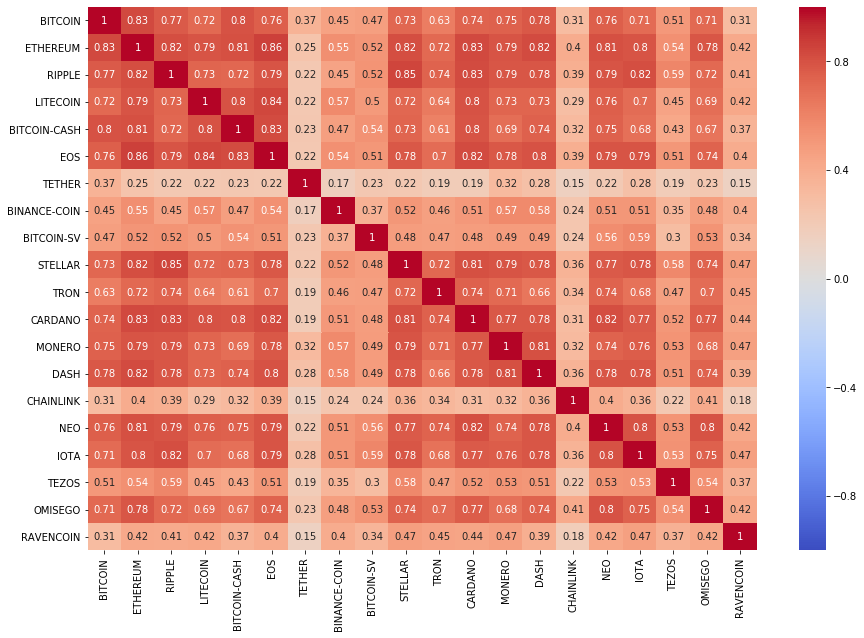

In [22]:
criteria = df_pct['Year'].isin([2019])
img2=correlation_map(df_pct[criteria].drop(columns=['DATE','Year','Month']), top20)

###  Distribution of correlation over the years
It is notable that almost all of the cryptocurrencies have become more correlated with each other across the board. In practice, when investing in the stock market, having a diversified portfolio reduces risk. However, having a diversified portfolio of the top 20 coins to spread risk, does not have the same effect as in trading stocks.  

Likewise, stable coins have been show to provide the stability needed to reduce fluctuation outside of the cryptocurrency space since underlying asset is not correlated with Bitcoin. However the main [criticisms](https://www.investopedia.com/tech/goldpegged-vs-usdpegged-cryptocurrencies/) of stable coins (besides those that are centralized) is proving that  the amount of the commodity/fiat used to back the stable coin, reflects the circulating supply of the stable coin.  

Interesting enough, Ravencoin which is a fork of Bitcoin with the added feature of Asset issuance, and transfer has a very low correlation with Bitcoin and most of the altcoins in the top 20. Not sure of the reason for this but it is definitely one of the coins to keep an eye on.  

Also, while Bitcoin, Etherum and Litecoin has been in the top 5 for the past 5 years, it would be interesting to further evaluate what are the drivers for other coins moving into the top 20. However, this is beyond the scope of this post.

In [23]:
def correlation_trend(data, columns, year):
    ''' Calculates correlation of altcoins with bitcoin.

    Parameters:
    -----------
        data (pd): Cleaned Pandas dataframe of values
        columns (list): Column names for which  the correlation is wanted

    Returns:
    --------
        corrYear(pd): correlation of altcoins with bitcoin

    '''
    
    correlation = (data.loc[:, columns]).corr()

    corrYear= pd.DataFrame(correlation.loc[:, 'BITCOIN'])
    #corrYear.index.name = 'Coin'
    
    corrYear['Year']=year
    corrYear['Coin']=corrYear.index
    #corrYear.reset_index()
    return corrYear

# Create dataframe of the top 20 altcoins that are correlated with bitcoin over the years
# Initialize df
criteria = df_pct['Year'].isin([2014])
df3=correlation_trend(df_pct[criteria], top20, 2014)

years= [2015, 2016,2017, 2018,2019] 
for i, year in enumerate(years):
    criteria = df_pct['Year'].isin([year])
    
    temp=correlation_trend(df_pct[criteria], top20, year)
    df3=df3.append(temp, ignore_index = True) 

In [24]:
img3=df3.hvplot.kde('BITCOIN',alpha=0.6,height=800,width=1000, by='Year', xlabel='Correlation with Bitcoin').opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})

##  Bull run at the end of 2019

This analysis is largely speculative and is based box plots grouped by months, for the past 6 years.
In 2015, 2016 and 2017 we see a spike in the Bitcoin price around moths 6 and 7. After which we see a bull run at the end of the year.
2014 and 2018 is quite similar, where there is growth in months 5 and 6 but the months following, are sluggish and signals a bearish market.
Given these trends, for 2019, if august looks as strong as July, we could be in for another bull run, breaking previous records.
The Histogram below also shows that the high Bitcoin price events tend to take place in in December and January.

### Trend by year

In [25]:
df.hvplot.box(y='BITCOIN',by=['Month'],groupby=['Year'],
                 height=500,width=800).opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})

:DynamicMap   [Year]
   :BoxWhisker   [Month]   (BITCOIN)

In [32]:
img4=df.hvplot.box(y='BITCOIN',by=['Year','Month'],outlier_color='red',
                 height=500,width=1500,logy=True,ylabel='Bitcoin Price USD').opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})

### Distribution by year and month

In [27]:
criteria = df['Year'].isin([2019, 2018,2017])
df[criteria].hvplot.kde(y='BITCOIN',alpha=0.8,height=800,width=1000, by='Year').opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})

:NdOverlay   [Year]
   :Distribution   [BITCOIN]   (Density)

In [28]:
img5=df.hvplot.kde(y='BITCOIN',alpha=0.6,height=500,width=1000, cmap='PiYG', by=['Month'])
img5.opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})


:NdOverlay   [Month]
   :Distribution   [BITCOIN]   (Density)

In [29]:
img6=df.sort_values('Month').hvplot.box(y='BITCOIN',by=['Month'],
                 height=500,width=1000,invert=True, ylabel='Bitcoin USD').opts(fontsize={'title': 16, 'labels': 14, 'xticks': 14, 'yticks': 14})

In [33]:
#hvplot.save(img1, 'img1.png')
#hvplot.save(img3, 'img3.png')
#hvplot.save(img4, 'img4.png')
#hvplot.save(img5, 'img5.png')
#hvplot.save(img6, 'img6.png')
#!!jupyter nbconvert *.ipynb --to slides --post serve